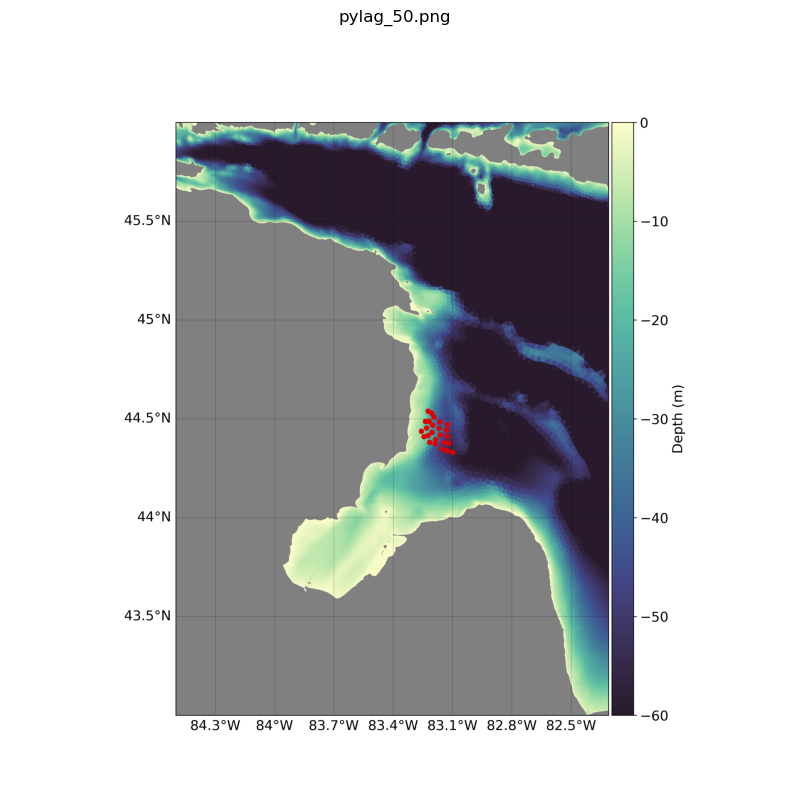

In [6]:
import os
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from PIL import Image
from IPython.display import HTML
import re 

# Function to read PNG files and sort them
def read_png_files(folder_path):
    file_list = os.listdir(folder_path)
    png_files = [file for file in file_list if file.endswith('.png')]
    png_files.sort(key=lambda f: int(re.sub('\D', '', f)))
    return [os.path.join(folder_path, file) for file in png_files]

# Function to update plot for animation
def update(frame):
    plt.clf()  # Clear the current figure
    try:
        img = Image.open(frames[frame])
        im = plt.imshow(img)
        plt.axis('off')
        # Add title to the plot
        plt.title(os.path.basename(frames[frame]), fontsize=12)
        return im,  # Return a tuple containing the AxesImage object
    except Exception as e:
        print(f"Error reading file {frames[frame]}: {e}")
        return None,

# Folder path containing PNG files
folder_path = "/home/samin/data/FVCOME_OUTPUT/simulations/horon/results/2308/change_releasezone"

# Read PNG files and sort them
frames = read_png_files(folder_path)

# Create figure and plot first frame
fig = plt.figure(figsize=(10, 10))

# Create animation
ani = FuncAnimation(fig, update, frames=len(frames), interval=100, blit=True)

# Save animation in the folder_path directory
ani.save(os.path.join(folder_path, 'animation_Ausable_202308.gif'), writer='pillow')

HTML(ani.to_jshtml())